In [1]:
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
path = "D:\\Pulkit\\2017 Class-XII\\Google Advanced Dara Analytics Professional Certificate\\3 - Go Beyond Numbers - Translate Data into Insights\\Datasets\\"

In [2]:
df = pd.read_csv(path + "nldn-tiles-2018.csv", skiprows = [0, 1])
df2 = pd.read_csv(path + "nldn-tiles-2021.csv", skiprows = [0, 1])

In [3]:
df = pd.concat([df, df2])
del df2

In [4]:
df.rename(columns={'#ZDAY' : 'ZDAY', 'TOTAL_COUNT':'number_of_strikes'}, inplace = True)

In [107]:
df.head(10)

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,year
0,2018-01-01,-94.4,21.0,2,2018
1,2018-01-01,-46.6,43.5,1,2018
2,2018-01-01,-96.2,22.0,1,2018
3,2018-01-01,-94.5,22.0,1,2018
4,2018-01-01,-58.5,40.0,1,2018
5,2018-01-01,-76.0,18.4,1,2018
6,2018-01-01,-94.9,20.2,1,2018
7,2018-01-01,-94.9,20.3,1,2018
8,2018-01-01,-93.5,20.3,1,2018
9,2018-01-01,-94.9,20.4,2,2018


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6257037 entries, 0 to 2856024
Data columns (total 4 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ZDAY               int64  
 1   CENTERLON          float64
 2   CENTERLAT          float64
 3   number_of_strikes  int64  
dtypes: float64(2), int64(2)
memory usage: 238.7 MB


In [7]:
df.describe()

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes
count,6.257037e+06,6.257037e+06,6.257037e+06,6.257037e+06
mean,2.019441e+07,-9.069817e+01,3.363999e+01,1.077221e+01
std,1.495200e+04,1.303828e+01,7.725301e+00,2.633130e+01
min,2.018010e+07,-1.418000e+02,1.660000e+01,1.000000e+00
25%,2.018071e+07,-1.006000e+02,2.770000e+01,1.000000e+00
50%,2.018100e+07,-9.060000e+01,3.330000e+01,3.000000e+00
75%,2.021072e+07,-8.100000e+01,3.950000e+01,9.000000e+00
max,2.021123e+07,-4.300000e+01,5.170000e+01,2.211000e+03


In [28]:
dt.datetime.strptime('20180104', '%Y%m%d').date()#strftime('%Y-%m-%d')

datetime.date(2018, 1, 4)

In [5]:
df['ZDAY'] = pd.to_datetime(df['ZDAY'], format='%Y%m%d')

In [6]:
df['month'] = df['ZDAY'].dt.month
df['month_txt'] = df['ZDAY'].dt.month_name().str.slice(stop=3)
df.head(10)

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,month,month_txt
0,2018-01-01,-94.4,21.0,2,1,Jan
1,2018-01-01,-46.6,43.5,1,1,Jan
2,2018-01-01,-96.2,22.0,1,1,Jan
3,2018-01-01,-94.5,22.0,1,1,Jan
4,2018-01-01,-58.5,40.0,1,1,Jan
5,2018-01-01,-76.0,18.4,1,1,Jan
6,2018-01-01,-94.9,20.2,1,1,Jan
7,2018-01-01,-94.9,20.3,1,1,Jan
8,2018-01-01,-93.5,20.3,1,1,Jan
9,2018-01-01,-94.9,20.4,2,1,Jan


In [11]:
#mon_df = df.groupby('month_txt').sum()['month'].reset_index().sort_values('month_txt', key=lambda x:pd.to_datetime(x, format = '%b').dt.month).reset_index().iloc[:,1:]

In [112]:
mon_df_2018 = df[df['ZDAY'] < '2019-01-01'].groupby(['month','month_txt']).sum().sort_values('month')['number_of_strikes'].reset_index()

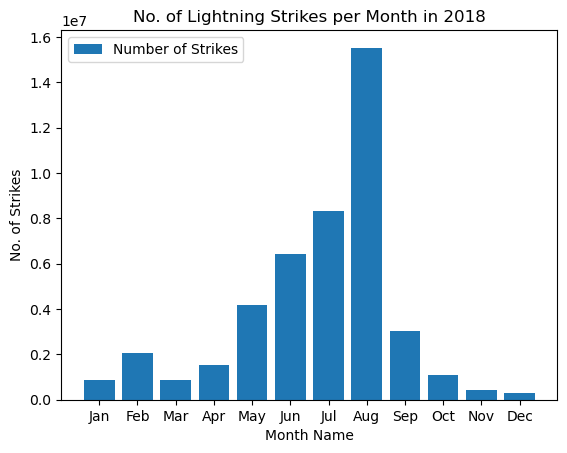

In [124]:
plt.bar(mon_df_2018['month_txt'], mon_df_2018['number_of_strikes'], label='Number of Strikes')
plt.xlabel('Month Name')
plt.ylabel('No. of Strikes')
plt.title('No. of Lightning Strikes per Month in 2018')
plt.legend()
plt.show()

- Most number of strikes in 2018 occour in August

In [15]:
df['ZDAY'].dt.isocalendar().week

0          1
1          1
2          1
3          1
4          1
          ..
3401007    1
3401008    1
3401009    1
3401010    1
3401011    1
Name: week, Length: 3401012, dtype: UInt32

In [7]:
'''
df['week'] = df['ZDAY'].dt.strftime('%Y-W%V')
df['month'] = df['ZDAY'].dt.strftime('%Y-%m')
df['quarter'] = df['ZDAY'].dt.to_period('Q').dt.strftime('%Y-Q%q')
df['year'] = df['ZDAY'].dt.strftime('%Y')
'''
df['year'] = np.char.mod('%d', df['ZDAY'].dt.year)

In [10]:
df['week'] = np.array(df['year']) + "-W" + np.char.mod('%02d', np.array(df['ZDAY'].dt.isocalendar().week))
df['month'] = np.array(df['year']) + "-" + np.char.mod('%02d', df['ZDAY'].dt.month)
df['quarter'] = np.array(df['year']) + "-Q" + np.char.mod('%d', df['ZDAY'].dt.quarter)

In [115]:
df.head(10)

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,month,month_txt,year,week,quarter
0,2018-01-01,-94.4,21.0,2,2018-01,Jan,2018,2018-W01,2018-Q1
1,2018-01-01,-46.6,43.5,1,2018-01,Jan,2018,2018-W01,2018-Q1
2,2018-01-01,-96.2,22.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
3,2018-01-01,-94.5,22.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
4,2018-01-01,-58.5,40.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
5,2018-01-01,-76.0,18.4,1,2018-01,Jan,2018,2018-W01,2018-Q1
6,2018-01-01,-94.9,20.2,1,2018-01,Jan,2018,2018-W01,2018-Q1
7,2018-01-01,-94.9,20.3,1,2018-01,Jan,2018,2018-W01,2018-Q1
8,2018-01-01,-93.5,20.3,1,2018-01,Jan,2018,2018-W01,2018-Q1
9,2018-01-01,-94.9,20.4,2,2018-01,Jan,2018,2018-W01,2018-Q1


In [116]:
week_df_2018 = df[df['year']=='2018'].groupby('week').sum()['number_of_strikes'].reset_index()

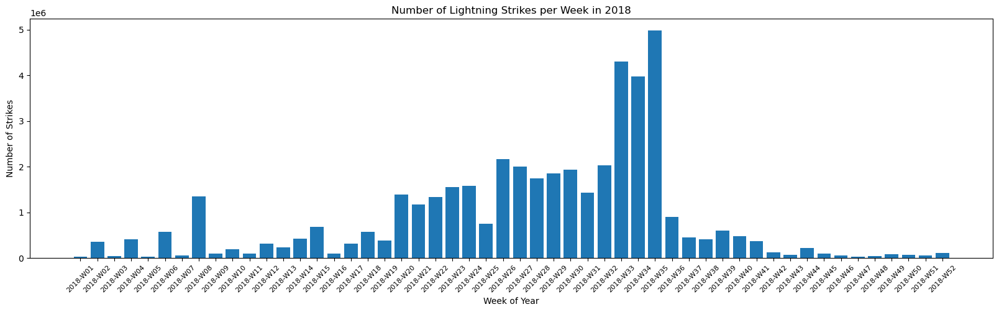

In [123]:
#plt.bar(week_df_2018.index, week_df_2018['number_of_strikes'])
plt.figure(figsize=(20,5))
plt.bar(week_df_2018['week'], week_df_2018['number_of_strikes'])
plt.xlabel('Week of Year')
plt.ylabel('Number of Strikes')
plt.title('Number of Lightning Strikes per Week in 2018')

plt.xticks(rotation=45, fontsize=8);

In [118]:
quarter_df = df.groupby('quarter').sum()['number_of_strikes'].reset_index()

In [127]:
#quarter_df['number_of_strikes'] = 
quarter_df['number_of_strikes_formatted'] = quarter_df['number_of_strikes'].div(1e6).round(1).astype(str) + 'M'

In [120]:
def addlabels(x, y, labels):
    for i in range(len(x)):
        plt.text(i, y[i], labels[i], ha = 'center', va = 'bottom')
    

Text(0.5, 1.0, 'Number of Lightning Strikes per Quarter for 2018 and 2021')

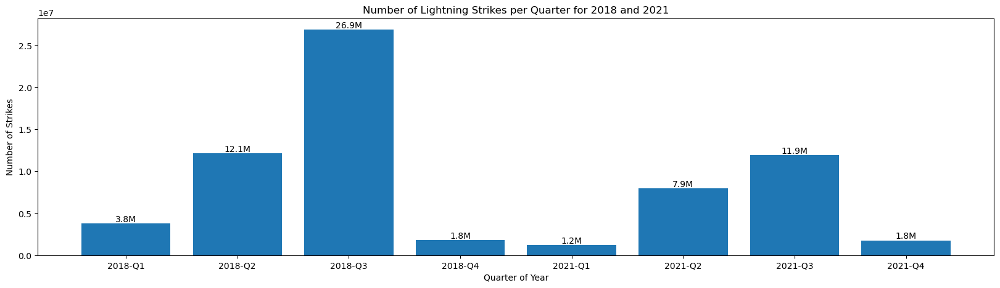

In [128]:
plt.figure(figsize=[20, 5])
plt.bar(quarter_df['quarter'], quarter_df['number_of_strikes'])
addlabels(quarter_df['quarter'], quarter_df['number_of_strikes'], quarter_df['number_of_strikes_formatted'])
plt.xlabel('Quarter of Year')
plt.ylabel('Number of Strikes')
plt.title('Number of Lightning Strikes per Quarter for 2018 and 2021')

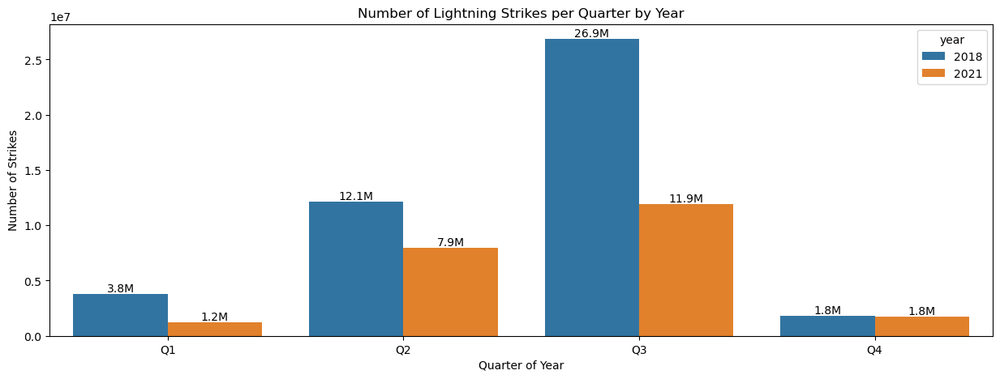

In [144]:
quarter_df['year'] = quarter_df['quarter'].str[:4]
quarter_df['quarter_no'] = quarter_df['quarter'].str[-2:]
quarter_df.head()

plt.figure(figsize=[15, 5])

p = sns.barplot(data = quarter_df, x = 'quarter_no', y = 'number_of_strikes', hue = 'year')
for b in p.patches:
    p.annotate(str(round(b.get_height()/1e6, 1)) + 'M', 
               (b.get_x() + b.get_width()/2, b.get_height() + 1.2e6), 
               ha = 'center', va = 'bottom', xytext = (0, -12), textcoords = 'offset points')

plt.xlabel('Quarter of Year')
plt.ylabel('Number of Strikes')
plt.title('Number of Lightning Strikes per Quarter by Year');

In [145]:
#temp1 = df.head(10)
#temp2 = df.iloc[10:20, :]
#pd.concat([temp1, temp2])
#temp1.merge(temp2)
#temp1.join(temp2)

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,month,month_txt,year,week,quarter
0,2018-01-01,-94.4,21.0,2,2018-01,Jan,2018,2018-W01,2018-Q1
1,2018-01-01,-46.6,43.5,1,2018-01,Jan,2018,2018-W01,2018-Q1
2,2018-01-01,-96.2,22.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
3,2018-01-01,-94.5,22.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
4,2018-01-01,-58.5,40.0,1,2018-01,Jan,2018,2018-W01,2018-Q1
5,2018-01-01,-76.0,18.4,1,2018-01,Jan,2018,2018-W01,2018-Q1
6,2018-01-01,-94.9,20.2,1,2018-01,Jan,2018,2018-W01,2018-Q1
7,2018-01-01,-94.9,20.3,1,2018-01,Jan,2018,2018-W01,2018-Q1
8,2018-01-01,-93.5,20.3,1,2018-01,Jan,2018,2018-W01,2018-Q1
9,2018-01-01,-94.9,20.4,2,2018-01,Jan,2018,2018-W01,2018-Q1


In [8]:
df_18 = df[df['ZDAY'].dt.year == 2018].copy()
df_18['center_point_geom'] = list('POINT(' + str(x) + ', ' + str(y) + ')' for x, y in zip(df_18['CENTERLON'], df_18['CENTERLAT']))
df_18 = df_18.drop(columns=['CENTERLON', 'CENTERLAT'])
df_18 = df_18[['ZDAY', 'center_point_geom', 'number_of_strikes', 'year']]
df_18.drop_duplicates().shape

(3401012, 4)

In [204]:
df_18.sort_values('number_of_strikes', ascending=False).head()

,ZDAY,center_point_geom,number_of_strikes,year
2474376,2018-08-20,"POINT(-92.5, 35.5)",2211,2018
2373813,2018-08-16,"POINT(-96.1, 36.1)",2142,2018
2384310,2018-08-17,"POINT(-90.2, 36.1)",2061,2018
2382818,2018-08-17,"POINT(-89.9, 35.9)",2031,2018
2373812,2018-08-16,"POINT(-96.2, 36.1)",1902,2018


In [205]:
df_18.center_point_geom.value_counts()

POINT(-81.5, 22.5)     108
POINT(-84.1, 22.4)     108
POINT(-82.5, 22.9)     107
POINT(-82.7, 22.9)     107
POINT(-84.2, 22.3)     106
                      ... 
POINT(-129.2, 36.7)      1
POINT(-129.3, 36.7)      1
POINT(-126.1, 36.6)      1
POINT(-73.2, 22.5)       1
POINT(-122.3, 47.8)      1
Name: center_point_geom, Length: 170855, dtype: int64

In [206]:
df_18.center_point_geom.value_counts()[:20].rename_axis('unique_values').reset_index(name = 'counts').style.background_gradient()

,unique_values,counts
0,"POINT(-81.5, 22.5)",108
1,"POINT(-84.1, 22.4)",108
2,"POINT(-82.5, 22.9)",107
3,"POINT(-82.7, 22.9)",107
4,"POINT(-84.2, 22.3)",106
5,"POINT(-82.5, 22.8)",106
6,"POINT(-75.9, 20.4)",105
7,"POINT(-76.0, 20.5)",105
8,"POINT(-78.0, 18.2)",104
9,"POINT(-82.2, 22.9)",104


No notable drops observed in top 20 values and so data is evenly distributed.

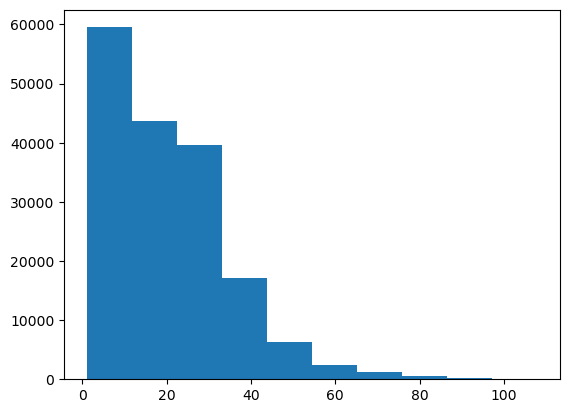

In [208]:
plt.hist(df_18.center_point_geom.value_counts());

In [209]:
df_18['week'] = df_18['ZDAY'].dt.isocalendar().week
df_18['weekday'] = df_18['ZDAY'].dt.day_name()
df_18.head()

,ZDAY,center_point_geom,number_of_strikes,year,week,weekday
0,2018-01-01,"POINT(-94.4, 21.0)",2,2018,1,Monday
1,2018-01-01,"POINT(-46.6, 43.5)",1,2018,1,Monday
2,2018-01-01,"POINT(-96.2, 22.0)",1,2018,1,Monday
3,2018-01-01,"POINT(-94.5, 22.0)",1,2018,1,Monday
4,2018-01-01,"POINT(-58.5, 40.0)",1,2018,1,Monday


In [210]:
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_18.groupby('weekday').mean()['number_of_strikes'].reset_index()

,weekday,number_of_strikes
0,Friday,13.349972
1,Monday,13.152804
2,Saturday,12.732694
3,Sunday,12.324717
4,Thursday,13.240594
5,Tuesday,13.813599
6,Wednesday,13.224568


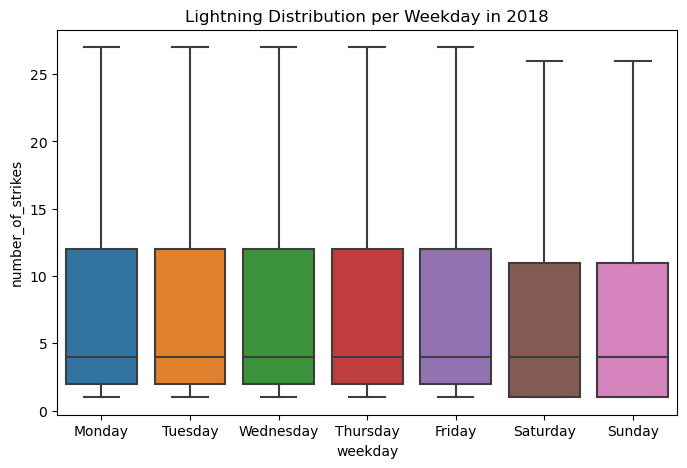

In [212]:
plt.figure(figsize=[8,5])
g = sns.boxplot(data = df_18, x = 'weekday', y = 'number_of_strikes', order = weekday_order, showfliers = False);
g.set_title('Lightning Distribution per Weekday in 2018');

**Boxplot Conclusions**
- Median of number of strikes is same for all (represented by horizontal line inside the boxes)
- Strikes on weekends are slightly lesser than that on Weekdays. **Maybe** people are busy enjoying and report less.
- Otherwise number of strikes are uniform throught the week

In [144]:
strikes_by_year_df = df[['year', 'number_of_strikes']].groupby('year').sum().reset_index()

In [184]:
strikes_by_month_df = df.groupby(['month_txt', 'year']).sum()['number_of_strikes'].reset_index()
#agg(perc_of_strikes = pd.NamedAgg(column = 'number_of_strikes', aggfunc = 'sum'))

In [185]:
strikes_by_month_df = strikes_by_month_df.merge(strikes_by_year_df, on = 'year', how = 'outer')
strikes_by_month_df.rename(columns={'number_of_strikes_x' : 'number_of_strikes', 'number_of_strikes_y' : 'year_total_strikes'}, inplace = True)
strikes_by_month_df

,month_txt,year,number_of_strikes,year_total_strikes
0,Apr,2018,1524339,44600989
1,Aug,2018,15525255,44600989
2,Dec,2018,312097,44600989
3,Feb,2018,2071315,44600989
4,Jan,2018,860045,44600989
5,Jul,2018,8320400,44600989
6,Jun,2018,6445083,44600989
7,Mar,2018,854168,44600989
8,May,2018,4166726,44600989
9,Nov,2018,409263,44600989


In [187]:
strikes_by_month_df['monthly_perc'] = strikes_by_month_df['number_of_strikes']/strikes_by_month_df['year_total_strikes']*100
strikes_by_month_df

,month_txt,year,number_of_strikes,year_total_strikes,monthly_perc
0,Apr,2018,1524339,44600989,3.417725
1,Aug,2018,15525255,44600989,34.809217
2,Dec,2018,312097,44600989,0.699754
3,Feb,2018,2071315,44600989,4.644101
4,Jan,2018,860045,44600989,1.928309
5,Jul,2018,8320400,44600989,18.655192
6,Jun,2018,6445083,44600989,14.450538
7,Mar,2018,854168,44600989,1.915132
8,May,2018,4166726,44600989,9.342228
9,Nov,2018,409263,44600989,0.917610


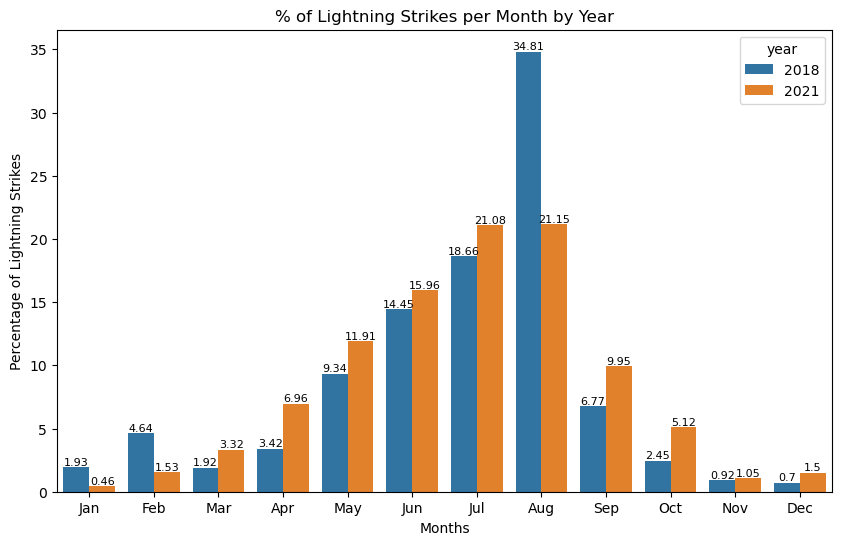

In [190]:
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.figure(figsize = [10, 6])
q = sns.barplot(data = strikes_by_month_df, x = 'month_txt', y = 'monthly_perc', hue = 'year', order = month_order)
for r in q.patches:
    q.annotate(round(r.get_height(),2), (r.get_x() + r.get_width()/2, r.get_height()), ha = 'center', va = 'bottom', fontsize=8)

plt.xlabel('Months')
plt.ylabel('Percentage of Lightning Strikes')
plt.title('% of Lightning Strikes per Month by Year');

In [109]:
df_aug_18 = df[(df['month'] == 8) & (df['year'] == '2018')].drop(['year', 'month', 'month_txt'], axis=1).reset_index(drop = True)
df_aug_18.shape

(717530, 4)

In [110]:
df_us_zip = pd.read_csv(path + "uszips.csv")
df_us_zip.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,county_fips,county_name,county_weights,county_names_all,county_fips_all,imprecise,military,timezone
0,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,17126.0,102.6,72001,Adjuntas,"{""72001"": 98.73, ""72141"": 1.27}",Adjuntas|Utuado,72001|72141,False,False,America/Puerto_Rico
1,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37895.0,482.5,72003,Aguada,"{""72003"": 100}",Aguada,72003,False,False,America/Puerto_Rico
2,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,49136.0,552.4,72005,Aguadilla,"{""72005"": 99.76, ""72099"": 0.24}",Aguadilla|Moca,72005|72099,False,False,America/Puerto_Rico
3,606,18.16585,-66.93716,Maricao,PR,Puerto Rico,True,NaN,5751.0,50.1,72093,Maricao,"{""72093"": 82.26, ""72153"": 11.68, ""72121"": 6.06}",Maricao|Yauco|Sabana Grande,72093|72153|72121,False,False,America/Puerto_Rico
4,610,18.29110,-67.12243,Anasco,PR,Puerto Rico,True,NaN,26153.0,272.1,72011,Añasco,"{""72011"": 96.71, ""72099"": 2.81, ""72083"": 0.37,...",Añasco|Moca|Las Marías|Aguada,72011|72099|72083|72003,False,False,America/Puerto_Rico


In [111]:
df_us_zip = df_us_zip[['zip', 'lat', 'lng', 'city', 'state_id', 'state_name']]
df_us_zip['lat'] = df_us_zip['lat'].round(1)
df_us_zip['lng'] = df_us_zip['lng'].round(1)
df_us_zip.shape

(33788, 6)

In [112]:
print(df_us_zip.sort_values(['lat', 'lng']))
print()
print(df_aug_18.sort_values(['CENTERLAT', 'CENTERLON']))

         zip   lat    lng         city state_id      state_name
32480  96799 -14.2 -170.4    Pago Pago       AS  American Samoa
32504  96916  13.3  144.7       Merizo       GU            Guam
32505  96917  13.3  144.7     Inarajan       GU            Guam
32503  96915  13.4  144.7   Santa Rita       GU            Guam
32506  96928  13.4  144.7         Agat       GU            Guam
...      ...   ...    ...          ...      ...             ...
33759  99789  70.2 -151.0      Nuiqsut       AK          Alaska
33707  99734  70.4 -149.0  Prudhoe Bay       AK          Alaska
33761  99791  70.5 -157.4      Atqasuk       AK          Alaska
33753  99782  70.6 -160.0   Wainwright       AK          Alaska
33698  99723  71.3 -156.8       Barrow       AK          Alaska

[33788 rows x 6 columns]

             ZDAY  CENTERLON  CENTERLAT  number_of_strikes
114625 2018-08-06      -76.4       16.6                  1
437130 2018-08-19      -76.4       16.7                  3
611181 2018-08-27      -76.4

- The zip data set has different city names for same latitude-longitude pairs after rounding.
- So its best to remove duplicates as joining with the other dataset requires rounding off

In [113]:
df_us_zip = df_us_zip.drop_duplicates(subset=['lat', 'lng'])
df_us_zip

,zip,lat,lng,city,state_id,state_name
0,601,18.2,-66.8,Adjuntas,PR,Puerto Rico
1,602,18.4,-67.2,Aguada,PR,Puerto Rico
2,603,18.5,-67.1,Aguadilla,PR,Puerto Rico
3,606,18.2,-66.9,Maricao,PR,Puerto Rico
4,610,18.3,-67.1,Anasco,PR,Puerto Rico
...,...,...,...,...,...,...
33783,99923,56.0,-130.0,Hyder,AK,Alaska
33784,99925,55.6,-133.0,Klawock,AK,Alaska
33785,99926,55.1,-131.5,Metlakatla,AK,Alaska
33786,99927,56.3,-133.6,Point Baker,AK,Alaska


In [115]:
df_zip_joined = df_aug_18.merge(df_us_zip, left_on = ['CENTERLAT', 'CENTERLON'], right_on = ['lat', 'lng'], how = 'left').drop(['lat', 'lng'], axis = 1)
df_zip_joined

,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,zip,city,state_id,state_name
0,2018-08-01,-101.6,22.6,1,NaN,NaN,NaN,NaN
1,2018-08-01,-100.8,22.6,1,NaN,NaN,NaN,NaN
2,2018-08-01,-100.5,22.6,1,NaN,NaN,NaN,NaN
3,2018-08-01,-90.4,22.7,1,NaN,NaN,NaN,NaN
4,2018-08-01,-89.5,22.7,1,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
717525,2018-08-31,-89.8,47.7,48,NaN,NaN,NaN,NaN
717526,2018-08-31,-89.7,47.7,33,NaN,NaN,NaN,NaN
717527,2018-08-31,-89.6,47.7,48,NaN,NaN,NaN,NaN
717528,2018-08-31,-89.5,47.7,51,NaN,NaN,NaN,NaN


In [116]:
df_zip_joined.describe()

,CENTERLON,CENTERLAT,number_of_strikes,zip
count,717530.000000,717530.000000,717530.000000,119304.000000
mean,-90.875445,33.328572,21.637081,48458.544726
std,13.648429,7.938831,48.029525,21729.726769
min,-133.900000,16.600000,1.000000,1001.000000
25%,-102.800000,26.900000,3.000000,31698.000000
50%,-90.300000,33.200000,6.000000,48069.500000
75%,-80.900000,39.400000,21.000000,67062.000000
max,-43.800000,51.700000,2211.000000,99401.000000


In [117]:
df_zip_joined[pd.isnull(df_zip_joined.state_id)].shape

(598226, 8)

In [123]:
df_zip_joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 717530 entries, 0 to 717529
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ZDAY               717530 non-null  datetime64[ns]
 1   CENTERLON          717530 non-null  float64       
 2   CENTERLAT          717530 non-null  float64       
 3   number_of_strikes  717530 non-null  int64         
 4   zip                119304 non-null  float64       
 5   city               119304 non-null  object        
 6   state_id           119304 non-null  object        
 7   state_name         119304 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 49.3+ MB


- info() shows non null value counts for each column which can be really usefull while inspecting a dataset.

In [118]:
top_loc_df = df_zip_joined.dropna().groupby(['CENTERLAT', 'CENTERLON']
                                           )['number_of_strikes'].sum().sort_values(ascending = False)
top_loc_df = top_loc_df[top_loc_df > 00].reset_index()
top_loc_df['colors'] = 80
top_loc_df

,CENTERLAT,CENTERLON,number_of_strikes,colors
0,36.1,-96.1,2662,80
1,36.1,-90.2,2646,80
2,26.3,-81.7,2511,80
3,26.8,-81.8,2452,80
4,35.9,-89.9,2349,80
...,...,...,...,...
22038,47.1,-114.9,1,80
22039,29.5,-97.9,1,80
22040,43.2,-76.1,1,80
22041,43.2,-77.9,1,80


In [119]:
fig1 = px.scatter_geo(top_loc_df, lat = 'CENTERLAT', lon = 'CENTERLON', size = 'number_of_strikes', color = 'colors')
fig1.update_layout(title_text = 'Top Locations with Strikes', geo_scope = 'usa')
fig1.show()

In [160]:
top_missing = df_zip_joined[pd.isnull(df_zip_joined.state_id)].groupby(['CENTERLAT', 'CENTERLON'])['number_of_strikes'].sum()
top_missing = top_missing.sort_values(ascending = False).reset_index()
top_missing

,CENTERLAT,CENTERLON,number_of_strikes
0,22.4,-84.2,3841
1,22.9,-82.9,3184
2,22.4,-84.3,2999
3,22.9,-83.0,2754
4,22.5,-84.1,2746
...,...,...,...
122854,46.8,-131.0,1
122855,46.8,-131.2,1
122856,46.8,-131.4,1
122857,46.8,-131.7,1


In [162]:
top_missing = top_missing[top_missing['number_of_strikes'] > 150]
top_missing.shape

(24782, 3)

In [163]:
fig2 = px.scatter_geo(top_missing, lat = 'CENTERLAT', lon = 'CENTERLON', size = 'number_of_strikes')
fig2.update_layout(title_text = 'Missing Data', geo_scope = 'usa');
fig2.show()

## Conclusions

- The plot show a lot of missing values in the dataset across almost whole of USA.
- The reason for the same is that the datasets are joined by center latitudes and longitudes of a city byt a city covers a range of latitudes and longitudes. 
- Hence some lightning stike latitudes which occured away from the city center have no matching zipcode and hence have NA values.
- To counter this problem, latitudes and longitudes in both datasets are being rounded to integers and duplicates in the zip dataset are being removed.

In [137]:
df_zip_round = df_us_zip.round().drop_duplicates(subset=['lat', 'lng'])
print(df_zip_round.shape)
df_rzip_joined = df_aug_18.round().merge(df_zip_round, left_on = ['CENTERLAT', 'CENTERLON'], right_on = ['lat', 'lng'], how = 'left').drop(['lat', 'lng'], axis = 1)
df_rzip_joined

(1082, 6)


,ZDAY,CENTERLON,CENTERLAT,number_of_strikes,zip,city,state_id,state_name
0,2018-08-01,-102.0,23.0,1,NaN,NaN,NaN,NaN
1,2018-08-01,-101.0,23.0,1,NaN,NaN,NaN,NaN
2,2018-08-01,-100.0,23.0,1,NaN,NaN,NaN,NaN
3,2018-08-01,-90.0,23.0,1,NaN,NaN,NaN,NaN
4,2018-08-01,-90.0,23.0,1,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
717525,2018-08-31,-90.0,48.0,48,55605.0,Grand Portage,MN,Minnesota
717526,2018-08-31,-90.0,48.0,33,55605.0,Grand Portage,MN,Minnesota
717527,2018-08-31,-90.0,48.0,48,55605.0,Grand Portage,MN,Minnesota
717528,2018-08-31,-90.0,48.0,51,55605.0,Grand Portage,MN,Minnesota


In [138]:
df_rzip_joined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 717530 entries, 0 to 717529
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ZDAY               717530 non-null  datetime64[ns]
 1   CENTERLON          717530 non-null  float64       
 2   CENTERLAT          717530 non-null  float64       
 3   number_of_strikes  717530 non-null  int64         
 4   zip                385008 non-null  float64       
 5   city               385008 non-null  object        
 6   state_id           385008 non-null  object        
 7   state_name         385008 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(1), object(3)
memory usage: 49.3+ MB


In [148]:
top_rloc = df_rzip_joined.dropna().groupby(['CENTERLAT', 'CENTERLON']
                                          )['number_of_strikes'].sum().sort_values(ascending = False).reset_index()
top_rloc

,CENTERLAT,CENTERLON,number_of_strikes
0,28.0,-82.0,107399
1,27.0,-82.0,100113
2,36.0,-90.0,90029
3,40.0,-94.0,71583
4,26.0,-82.0,71553
...,...,...,...
873,42.0,-121.0,5
874,48.0,-124.0,3
875,36.0,-119.0,3
876,45.0,-124.0,3


In [149]:
fig3 = px.scatter_geo(top_rloc, lat = 'CENTERLAT', lon = 'CENTERLON', size = 'number_of_strikes')
fig3.update_layout(title_text = 'Strikes By Location (Rounded)', geo_scope = 'usa')
fig3.show()

In [144]:
top_rmiss = df_rzip_joined[pd.isnull(df_rzip_joined.zip)].groupby(['CENTERLAT', 'CENTERLON'])['number_of_strikes'
                                                        ].sum().sort_values(ascending = False).reset_index()
top_rmiss

,CENTERLAT,CENTERLON,number_of_strikes
0,22.0,-80.0,90217
1,23.0,-82.0,84823
2,22.0,-84.0,82058
3,26.0,-108.0,74346
4,22.0,-81.0,71854
...,...,...,...
929,45.0,-134.0,1
930,44.0,-133.0,1
931,38.0,-54.0,1
932,47.0,-133.0,1


In [147]:
fig4 = px.scatter_geo(top_rmiss, lat = 'CENTERLAT', lon = 'CENTERLON', size = 'number_of_strikes')
fig4.update_layout(title_text = 'Strikes Without Zipcode (Rounded)', geo_scope = 'usa')
fig4.show()

## Conclusion

The geo-plot shows that all of the missing values in zip dataset lie outside the land region. These lightning strikes occured at water bodies which have no zip code and hence in this case the missing or NA values helped in getting insights in the data.
Thus NA values shouldn't be discarded right away. Instead the reasons why some particular values are missing should be explored.

In [3]:
year_sums = {}
for i in range(13, 22):
   year_sums['20' + str(i)] = pd.read_csv(path + "nldn-tiles-20" + str(i) + ".csv", skiprows = [0, 1])['TOTAL_COUNT'].sum()
year_sums

{'2013': 27600898,
 '2014': 34919173,
 '2015': 37894191,
 '2016': 41582229,
 '2017': 35095195,
 '2018': 44600989,
 '2019': 24935218,
 '2020': 15620068,
 '2021': 22801126}

In [44]:
year_sum_df = pd.DataFrame(list(year_sums.items())).rename(columns = {0:'Year', 1:'Total_Strikes'})
year_sum_df.iloc[6, -1] = 24935218*3      #ADDING OUTLIER 1
year_sum_df.iloc[3, -1] = 568      #ADDING OUTLIER 2
year_sum_df = year_sum_df.apply(pd.to_numeric)
year_sum_df

,Year,Total_Strikes
0,2013,27600898
1,2014,34919173
2,2015,37894191
3,2016,568
4,2017,35095195
5,2018,44600989
6,2019,74805654
7,2020,15620068
8,2021,22801126


In [45]:
def readable_no(num):
    '''Converts a large number into easily readable string'''
    if num > 1e6:
        return "{:.1f}M".format(num/1e6) 
    else:
        return "{:.0f}K".format(num/1e3) 
    
year_sum_df['Total_strikes_readable'] = year_sum_df['Total_Strikes'].apply(readable_no)
year_sum_df

,Year,Total_Strikes,Total_strikes_readable
0,2013,27600898,27.6M
1,2014,34919173,34.9M
2,2015,37894191,37.9M
3,2016,568,1K
4,2017,35095195,35.1M
5,2018,44600989,44.6M
6,2019,74805654,74.8M
7,2020,15620068,15.6M
8,2021,22801126,22.8M


In [46]:
print("mean = " + readable_no(year_sum_df['Total_Strikes'].mean()))
print("median = " + readable_no(year_sum_df['Total_Strikes'].median()))

mean = 32.6M
median = 34.9M


- As mean is smaller than median, it signifies data is likely skewed to the left.

C:\Users\pulki\AppData\Local\Temp\ipykernel_7748\1306916190.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  r.set_xticklabels(np.array([readable_no(x) for x in g.get_xticks()]))


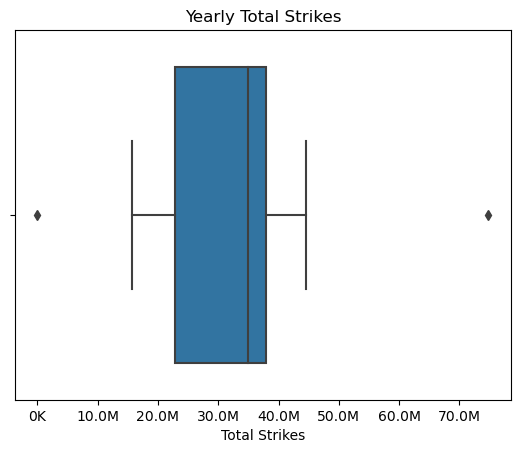

In [47]:
r = sns.boxplot(x = year_sum_df['Total_Strikes'])
g = plt.gca()
r.set_xticklabels(np.array([readable_no(x) for x in g.get_xticks()]))
plt.xlabel('Total Strikes')
plt.title('Yearly Total Strikes');

In [10]:
percentile25 = year_sum_df['Total_Strikes'].quantile(0.25)
percentile75 = year_sum_df['Total_Strikes'].quantile(0.75)

In [23]:
# Calculate Lower and upper limit for outliers
lower = percentile25 - 1.5 * (percentile75 - percentile25)
upper = percentile75 + 1.5 * (percentile75 - percentile25)

# Display Outliers' Data
print(year_sum_df[(year_sum_df['Total_Strikes'] < lower) | (year_sum_df['Total_Strikes'] > upper)])

   Year  Total_Strikes Total_strikes_readable
3  2016            568                     1K
6  2019       74805654                  74.8M


In [31]:
colors = ['b' if lower <= x <= upper else 'r' for x in year_sum_df['Total_Strikes']]
#colors = np.where((year_sum_df['Total_Strikes'] < lower) | (year_sum_df['Total_Strikes'] > upper), 'r', 'b')
colors

['b', 'b', 'b', 'r', 'b', 'b', 'r', 'b', 'b']

In [65]:
def addlabels(x, y):
    for i in range(len(x)):
        plt.text(x[i]-0.1, y[i]+1e6, s = readable_no(y[i]))

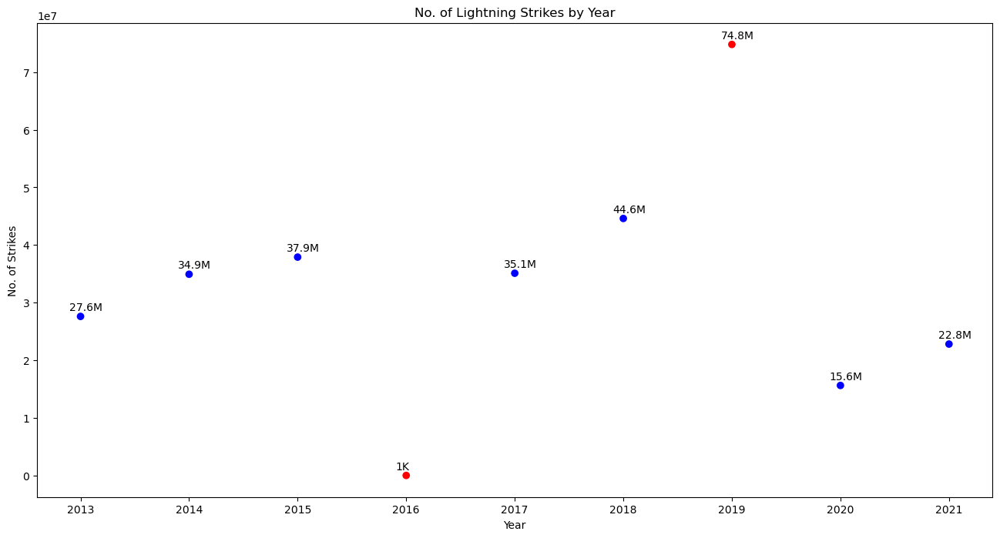

In [66]:
fix, ax = plt.subplots(figsize = [16, 8])
ax.scatter(x = year_sum_df['Year'], y = year_sum_df['Total_Strikes'], c = colors)

ax.set_title('No. of Lightning Strikes by Year')
ax.set_xlabel('Year')
ax.set_ylabel('No. of Strikes')

addlabels(year_sum_df['Year'], year_sum_df['Total_Strikes'])

#for tick in ax.get_xticklabels():
#    tick.set_rotation(45)
    
plt.show()

## Further Steps 

In case the original activity data was available, then data for the years correspponding to outiers would be further analysed in depth. For eg. in the vido the 2019 file only had data for the month of December and so it was excluded but the other outlier 1987 had data for all month and so shouldn't be excluded from analysis.

In [70]:
print("Mean no of strikes per year excluding outliers is", readable_no(year_sum_df[(year_sum_df['Total_Strikes'] > lower) & (year_sum_df['Total_Strikes'] < upper)]['Total_Strikes'].mean()))
print("Median no of strikes per year excluding outliers is", readable_no(year_sum_df[(year_sum_df['Total_Strikes'] > lower) & (year_sum_df['Total_Strikes'] < upper)]['Total_Strikes'].median()))

Mean no of strikes per year excluding outliers is 31.2M
Median no of strikes per year excluding outliers is 34.9M


## Input validation

In [17]:
df_16_to_18 = pd.concat([ pd.read_csv(path + "nldn-tiles-2016.csv", skiprows = [0, 1]), 
                          pd.read_csv(path + "nldn-tiles-2017.csv", skiprows = [0, 1]), 
                          pd.read_csv(path + "nldn-tiles-2018.csv", skiprows = [0, 1]) ])

In [30]:
df_16_to_18.rename(columns = {'#ZDAY' : 'ZDAY', 'TOTAL_COUNT' : 'number_of_strikes'}, inplace = True)
df_16_to_18['ZDAY'] = pd.to_datetime(df_16_to_18['ZDAY'], format='%Y%m%d')
df_16_to_18['year'] = df_16_to_18['ZDAY'].dt.year
df_16_to_18['month'] = df_16_to_18['ZDAY'].dt.month_name().str.slice(stop = 3)
df_16_to_18['month'] = pd.Categorical(df_16_to_18['month'], categories = month_order, ordered = True)

df_mon_16_18 = df_16_to_18.groupby(['year', 'month']).sum()['number_of_strikes'].reset_index()
df_mon_16_18.head()

,year,month,number_of_strikes
0,2016,Jan,313595
1,2016,Feb,312676
2,2016,Mar,2057527
3,2016,Apr,2636427
4,2016,May,5800500


In [31]:
# Create a categorical column buketing the no. of strikes per month into severness levels based on quantiles 
df_mon_16_18['strike_level'] = pd.qcut(df_mon_16_18['number_of_strikes'], 4, labels = ['Mild', 'Scattered', 'Heavy', 'Severe'])
df_mon_16_18.head()

,year,month,number_of_strikes,strike_level
0,2016,Jan,313595,Mild
1,2016,Feb,312676,Mild
2,2016,Mar,2057527,Scattered
3,2016,Apr,2636427,Heavy
4,2016,May,5800500,Severe


In [32]:
# label encoding for Strike levels
df_mon_16_18['strike_level_code'] = df_mon_16_18['strike_level'].cat.codes
df_mon_16_18.head()

,year,month,number_of_strikes,strike_level,strike_level_code
0,2016,Jan,313595,Mild,0
1,2016,Feb,312676,Mild,0
2,2016,Mar,2057527,Scattered,1
3,2016,Apr,2636427,Heavy,2
4,2016,May,5800500,Severe,3


In [33]:
# create dummy variables from strike levels
pd.get_dummies(df_mon_16_18['strike_level']).head(10)

,Mild,Scattered,Heavy,Severe
0,1,0,0,0
1,1,0,0,0
2,0,1,0,0
3,0,0,1,0
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1
7,0,0,0,1
8,0,0,1,0
9,0,1,0,0


In [34]:
# format df indices to prepare for plotting
mon_plot_df = df_mon_16_18.pivot('year', 'month', 'strike_level_code')
mon_plot_df.head()

month,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
year,,,,,,,,,,,,
2016,0,0,1,2,3,3,3,3,2,1,0,0
2017,1,0,1,2,2,2,3,3,2,1,0,0
2018,1,2,1,1,2,3,3,3,2,1,0,0


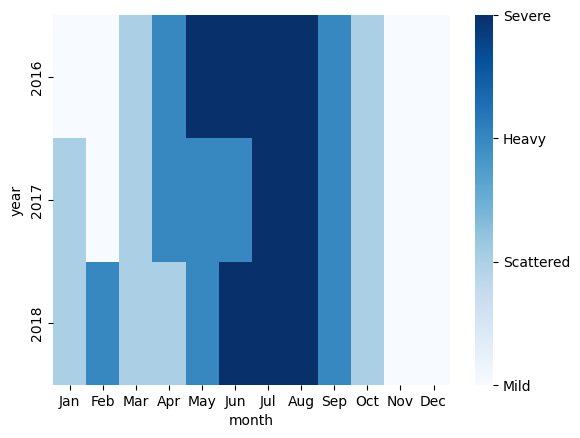

In [41]:
# Make a heatmap showing which months over the years had the most severe lightning strikes
h = sns.heatmap(mon_plot_df, cmap = 'Blues')
colorbar = h.collections[0].colorbar
colorbar.set_ticks([0, 1, 2, 3])
colorbar.set_ticklabels(['Mild', 'Scattered', 'Heavy', 'Severe'])
plt.show()

Using Label Encoding we found out that Jun to Aug are months with most severe lighning strikes

In [15]:
df_18.describe(include = 'all')

C:\Users\pulki\AppData\Local\Temp\ipykernel_556\2611757063.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_18.describe(include = 'all')


,ZDAY,center_point_geom,number_of_strikes,year
count,3401012,3401012,3.401012e+06,3401012
unique,357,170855,NaN,1
top,2018-09-01 00:00:00,"POINT(-81.5, 22.5)",NaN,2018
freq,31773,108,NaN,3401012
first,2018-01-01 00:00:00,NaN,NaN,NaN
last,2018-12-31 00:00:00,NaN,NaN,NaN
mean,NaN,NaN,1.311403e+01,NaN
std,NaN,NaN,3.212099e+01,NaN
min,NaN,NaN,1.000000e+00,NaN
25%,NaN,NaN,2.000000e+00,NaN


In [9]:
# Find missing dates in dataset
date_range_index = pd.date_range(start = '2018-01-01', end = '2018-12-31')
date_range_index.difference(df_18['ZDAY'])

DatetimeIndex(['2018-06-19', '2018-06-20', '2018-06-21', '2018-06-22',
               '2018-09-18', '2018-09-19', '2018-12-01', '2018-12-02'],
              dtype='datetime64[ns]', freq=None)

Some of the dates are missing but since the no. is relatively small, we can complete our analysis by making a note of the missing days in the presentation so anlyone who sees the visualization doesn't in clude those missing dates.

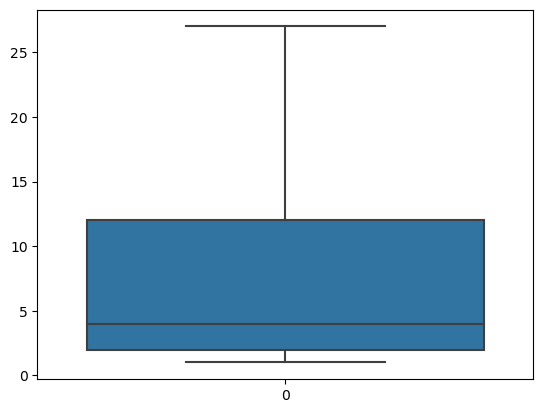

In [20]:
sns.boxplot(df_18['number_of_strikes'], showfliers = False);

Since most of the data points lie in 1-10 range or single digit stikes per day, the distribution is conceivable.

In [10]:
df_18.head()

,ZDAY,center_point_geom,number_of_strikes,year
0,2018-01-01,"POINT(-94.4, 21.0)",2,2018
1,2018-01-01,"POINT(-46.6, 43.5)",1,2018
2,2018-01-01,"POINT(-96.2, 22.0)",1,2018
3,2018-01-01,"POINT(-94.5, 22.0)",1,2018
4,2018-01-01,"POINT(-58.5, 40.0)",1,2018


In [11]:
# {2,} indiates check exp at left atleast 2 times; Then \. checks for decimal, \) for close parenthesis; 
# $ indicates check exp at left in the string end; ? indicates check exp at left exists
df_18['lat'] = df_18.center_point_geom.str.extract('(\d{2,}\.\d)\)$')
df_18['lon'] = df_18.center_point_geom.str.extract('\((-?\d{2,}\.\d)')

In [12]:
df_val_loc = df_18[['lat', 'lon']].drop_duplicates()
df_val_loc

,lat,lon
0,21.0,-94.4
1,43.5,-46.6
2,22.0,-96.2
3,22.0,-94.5
4,40.0,-58.5
...,...,...
3389456,44.3,-123.5
3400353,49.2,-126.3
3400354,49.9,-126.5
3400468,47.8,-122.4


In [15]:
fig5 = px.scatter_geo(df_val_loc, lat = 'lat', lon = 'lon')
#fig5.update_layout(title_text = 'Location of Strikes Validation', geo_scope = 'usa')
fig5.show()

As we can see most of the points lie inside USA but there are a few strikes outside landmark too but all are near USA.